# Normal / Gaussian Distribution and Z-score
### It implies how values are distributed around the mean of the dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv("weight-height.csv")
df = df.drop(columns=["Weight"])
df.head(5)

,Gender,Height
0,Male,73.847017
1,Male,68.781904
2,Male,74.110105
3,Male,71.730978
4,Male,69.881796


In [3]:
fig = px.histogram(df, x="Height",marginal="box",
                   hover_data=df.columns)
fig.show()

<AxesSubplot:xlabel='Height', ylabel='Count'>

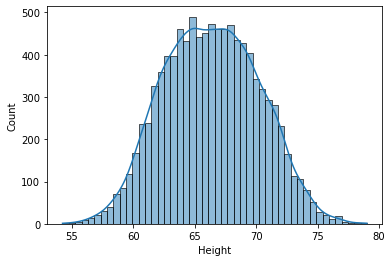

In [4]:
sns.histplot(df.Height, kde=True)

In [5]:
df.describe()

,Height
count,10000.000000
mean,66.367560
std,3.847528
min,54.263133
25%,63.505620
50%,66.318070
75%,69.174262
max,78.998742


## In general as rule data which is with -3 to +3 standard deviation can be considered as good data and beyond that can be considered as outlier

In [6]:
mean = df.Height.mean()
mean

66.36755975482106

In [7]:
df[df.Height < (mean - 3 * df.Height.std())]

,Gender,Height
6624,Female,54.616858
9285,Female,54.263133


In [8]:
df[df.Height > (mean + 3 * df.Height.std())]

,Gender,Height
994,Male,78.095867
1317,Male,78.462053
2014,Male,78.998742
3285,Male,78.528210
3757,Male,78.621374


In [9]:
df_no_outlier = df[(df.Height > (mean - 3 * df.Height.std())) & (df.Height < (mean + 3 * df.Height.std()))]
df_no_outlier.shape

(9993, 2)

In [10]:
fig = px.histogram(df_no_outlier, x="Height",marginal="box",
                   hover_data=df.columns)
fig.show()

## Zscore is how data is distributed around mean on the scale of standard deviation

### z = (x-mean) / std

In [11]:
df['zscore'] = (df.Height - mean) / df.Height.std()
df.head()

,Gender,Height,zscore
0,Male,73.847017,1.943964
1,Male,68.781904,0.627505
2,Male,74.110105,2.012343
3,Male,71.730978,1.393991
4,Male,69.881796,0.913375


In [14]:
df_no_outlier_zscore = df[(df.zscore > -3 ) & (df.zscore < 3)]
df_no_outlier_zscore.shape

(9993, 3)

In [15]:
fig = px.histogram(df_no_outlier_zscore, x="Height",marginal="box",
                   hover_data=df_no_outlier_zscore.columns)
fig.show()

In [31]:
min_per, max_per = df.Height.quantile([0.001, 0.999])
print(min_per, max_per)

56.06654891162125 77.06738853278372


In [32]:
df_no_outlier_percentile = df[(df.Height > min_per ) & (df.zscore < max_per)]
df_no_outlier_percentile.shape

(9990, 3)

In [33]:
fig = px.histogram(df_no_outlier_percentile, x="Height",marginal="box",
                   hover_data=df_no_outlier_percentile.columns)
fig.show()